# **<font color="red">Import libraries**

---



In [1]:
import os
import pandas as pd
import zipfile
from google.colab import files
!pip install rarfile


In [2]:
!pip install nltk

# <font color="red">**Merging dataset**

---



In [3]:
import os
import pandas as pd
from google.colab import files
import rarfile

# Le chemin du fichier RAR et le dossier de destination
fichier_rar = '/content/Nouveau dossier (6).rar'
dossier_destination = '/content/data of scrapping texts_UnRar'

# Décompressez le fichier RAR
with rarfile.RarFile(fichier_rar, 'r') as rar_ref:
    rar_ref.extractall(dossier_destination)

# Le chemin du dossier contenant les fichiers CSV décompressés
dossier_csv = '/content/data of scrapping texts_UnRar'

# Créer une liste pour stocker les DataFrames de chaque fichier CSV
dfs = []

# Parcourir chaque fichier dans le dossier
for root, dirs, files in os.walk(dossier_csv):
    for fichier_csv in files:
        if fichier_csv.endswith('.csv'):
            chemin_complet = os.path.join(root, fichier_csv)
            df = pd.read_csv(chemin_complet)
            dfs.append(df)

# Concaténer tous les DataFrames en un seul
ensemble_de_donnees = pd.concat(dfs, ignore_index=True)

# Sauvegarder le résultat dans un nouveau fichier CSV
ensemble_de_donnees.to_csv('/content/DatasetGGLOBALE.csv', index=False)

# Print the list of files in the extracted directory
print(os.listdir(dossier_csv))


['Nouveau dossier (6)']


In [4]:
data=pd.read_csv('/content/DatasetWithResume.csv')
data

,URL,Content,Resume
0,https://www.nrk.no/kultur/finalistane-til-vixe...,Han glana lengselsfullt inn vindauget til pris...,Trygve Bennetsen (21) har hatt godt utbytte a...
1,https://www.learnnorwegiannaturally.com/blog/,Learn Norwegian Naturally\n\n\t\t\tNorwegian l...,Learn Norwegian Naturally with Norwegian less...
2,https://www.nrk.no/osloogviken/bekymret-for-tr...,"Oslos nye byrådsleder, Eirik Lae Solberg sier ...","Oslos nye byrådsleder, Eirik Lae Solberg sier..."
3,https://www.nrk.no/trondelag/xl/da-arvid-jama-...,Arvid Jåma har stått i Fosen-saken i over tjue...,Arvid Jåma har stått i Fosen-saken i over tju...
4,https://www.nrk.no/osloogviken/jonas-aarseth-h...,Familien tror Jonas Henriksen kunne vært i liv...,Politiet varsler nå en full gjennomgang av eg...
5,https://www.nrk.no/urix/ny-gaza-roysting-i-fns...,FNs tryggingsråd røystar tysdag kveld om å sto...,FNs tryggingsråd røystar tysdag kveld om å st...
6,https://www.learnnorwegiannaturally.com/catego...,Learn Norwegian Naturally\n\n\t\t\tNorwegian l...,Norwegian lessons by Peder B. Helland . Learn...
7,https://www.nrk.no/osloogviken/sykehuset-ostfo...,Helse Sør-Øst mener døgntilbudet til pasienter...,Thea Mathisen har slitt med spiseforstyrrelse...
8,https://radio.nrk.no/podkast/skiklubben,Forside\nUtforsk\nDirekte\nFølg\nDel\nHard lan...,Anders Aukland deler treningsformen han lenge...
9,https://www.nrk.no/sport/meiner-det-internasjo...,"«Flautt», «pinleg» og «komisk». Kritikken hagl...",Fide-president Arkadij Dvorkovitsj har hatt f...


# **<font color="red">Nettoyage des données**

---



**A-étape 1:** Cette étape consiste à préparer le texte brut pour le prétraitement. Il s'agit  d'éliminer les éléments qui ne sont pas utiles pour l'analyse ou la modélisation, tels que:

*  les balises HTML
*   les caractères spéciaux


*   les espaces blancs redondants

*   les stop words

**B-étape 2:** Conversion en Minuscules



---













**A-étape 1:**

---



In [5]:
import pandas as pd
import re
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
import string

**1- Élimination des balises HTML:**

---



In [6]:
# Fonction pour éliminer les balises HTML
def remove_html_tags(text):
    return re.sub(r'<.*?>', '', text)

In [7]:
import re
# Appliquer l'élimination des balises HTML à la colonne 'Content'
data['Content_No_HTML'] = data['Content'].apply(remove_html_tags)
data['Resume_No_HTML'] = data['Resume'].apply(remove_html_tags)

In [8]:
data1 = data[['Content_No_HTML', 'Resume_No_HTML']]
data1

,Content_No_HTML,Resume_No_HTML
0,Han glana lengselsfullt inn vindauget til pris...,Trygve Bennetsen (21) har hatt godt utbytte a...
1,Learn Norwegian Naturally\n\n\t\t\tNorwegian l...,Learn Norwegian Naturally with Norwegian less...
2,"Oslos nye byrådsleder, Eirik Lae Solberg sier ...","Oslos nye byrådsleder, Eirik Lae Solberg sier..."
3,Arvid Jåma har stått i Fosen-saken i over tjue...,Arvid Jåma har stått i Fosen-saken i over tju...
4,Familien tror Jonas Henriksen kunne vært i liv...,Politiet varsler nå en full gjennomgang av eg...
5,FNs tryggingsråd røystar tysdag kveld om å sto...,FNs tryggingsråd røystar tysdag kveld om å st...
6,Learn Norwegian Naturally\n\n\t\t\tNorwegian l...,Norwegian lessons by Peder B. Helland . Learn...
7,Helse Sør-Øst mener døgntilbudet til pasienter...,Thea Mathisen har slitt med spiseforstyrrelse...
8,Forside\nUtforsk\nDirekte\nFølg\nDel\nHard lan...,Anders Aukland deler treningsformen han lenge...
9,"«Flautt», «pinleg» og «komisk». Kritikken hagl...",Fide-president Arkadij Dvorkovitsj har hatt f...


**2-Élimination des caractères spéciaux:**

---



In [9]:
import string

# Étendre la liste de la ponctuation pour inclure d'autres caractères spécifiques
extended_punctuation = string.punctuation + '«»–…“”'

# Fonction pour éliminer la ponctuation y compris les caractères étendus
def remove_punctuation(text):
    return text.translate(str.maketrans('', '', extended_punctuation))

In [10]:
# Appliquer l'élimination de la ponctuation à la colonne résultante de l'étape 1
data['Content_No_Punct'] = data1['Content_No_HTML'].apply(remove_punctuation)
data['Resume_No_Punct'] = data1['Resume_No_HTML'].apply(remove_punctuation)

In [11]:
data2 = data[['Content_No_Punct', 'Resume_No_Punct']]
data2

,Content_No_Punct,Resume_No_Punct
0,Han glana lengselsfullt inn vindauget til pris...,Trygve Bennetsen 21 har hatt godt utbytte av ...
1,Learn Norwegian Naturally\n\n\t\t\tNorwegian l...,Learn Norwegian Naturally with Norwegian less...
2,Oslos nye byrådsleder Eirik Lae Solberg sier a...,Oslos nye byrådsleder Eirik Lae Solberg sier ...
3,Arvid Jåma har stått i Fosensaken i over tjue ...,Arvid Jåma har stått i Fosensaken i over tjue...
4,Familien tror Jonas Henriksen kunne vært i liv...,Politiet varsler nå en full gjennomgang av eg...
5,FNs tryggingsråd røystar tysdag kveld om å sto...,FNs tryggingsråd røystar tysdag kveld om å st...
6,Learn Norwegian Naturally\n\n\t\t\tNorwegian l...,Norwegian lessons by Peder B Helland Learn N...
7,Helse SørØst mener døgntilbudet til pasienter ...,Thea Mathisen har slitt med spiseforstyrrelse...
8,Forside\nUtforsk\nDirekte\nFølg\nDel\nHard lan...,Anders Aukland deler treningsformen han lenge...
9,Flautt pinleg og komisk Kritikken haglar mot D...,Fidepresident Arkadij Dvorkovitsj har hatt fl...


**3-elimination des espaces blancs redondants:**

---



In [12]:
# Fonction pour éliminer les espaces blancs redondants
def remove_extra_whitespaces(text):
    return re.sub(r'\s+', ' ', text).strip()

In [13]:
# Appliquer l'élimination des espaces blancs redondants à la colonne résultante de l'étape précédente
data['Content_no_espace'] = data2['Content_No_Punct'].apply(remove_extra_whitespaces)
data['Resume_no_espace'] = data2['Resume_No_Punct'].apply(remove_extra_whitespaces)

In [14]:
data3 = data[['Content_no_espace', 'Content_no_espace']]
data3

,Content_no_espace,Content_no_espace
0,Han glana lengselsfullt inn vindauget til pris...,Han glana lengselsfullt inn vindauget til pris...
1,Learn Norwegian Naturally Norwegian lessons by...,Learn Norwegian Naturally Norwegian lessons by...
2,Oslos nye byrådsleder Eirik Lae Solberg sier a...,Oslos nye byrådsleder Eirik Lae Solberg sier a...
3,Arvid Jåma har stått i Fosensaken i over tjue ...,Arvid Jåma har stått i Fosensaken i over tjue ...
4,Familien tror Jonas Henriksen kunne vært i liv...,Familien tror Jonas Henriksen kunne vært i liv...
5,FNs tryggingsråd røystar tysdag kveld om å sto...,FNs tryggingsråd røystar tysdag kveld om å sto...
6,Learn Norwegian Naturally Norwegian lessons by...,Learn Norwegian Naturally Norwegian lessons by...
7,Helse SørØst mener døgntilbudet til pasienter ...,Helse SørØst mener døgntilbudet til pasienter ...
8,Forside Utforsk Direkte Følg Del Hard langkjør...,Forside Utforsk Direkte Følg Del Hard langkjør...
9,Flautt pinleg og komisk Kritikken haglar mot D...,Flautt pinleg og komisk Kritikken haglar mot D...


**4-Suppression des stop words:**

**A- contexte generale:**chaque langue a un ensemble unique de mots fréquemment utilisés qui sont généralement filtrés lors de l'analyse de texte. Ces "mots vides" (stop words) sont typiques de la langue et ne contribuent souvent pas à la signification globale d'un texte.

**B-Exemple:** en anglais, les mots comme "the", "is", et "and" sont souvent considérés comme des stop words.

**C-Par conséquence :** En norvégien, la liste des stop words sera différente et spécifique à la grammaire et à l'usage courant de cette langue.

**D-Exemple des stopwords de la langue norvégienne:**

In [15]:
import nltk
from nltk.corpus import stopwords

# Télécharger la liste des mots vides
nltk.download('stopwords')

# Accéder à la liste des mots vides pour le norvégien
norwegian_stopwords = stopwords.words('norwegian')

# Afficher la liste des mots vides pour le norvégien
print(norwegian_stopwords)


['og', 'i', 'jeg', 'det', 'at', 'en', 'et', 'den', 'til', 'er', 'som', 'på', 'de', 'med', 'han', 'av', 'ikke', 'ikkje', 'der', 'så', 'var', 'meg', 'seg', 'men', 'ett', 'har', 'om', 'vi', 'min', 'mitt', 'ha', 'hadde', 'hun', 'nå', 'over', 'da', 'ved', 'fra', 'du', 'ut', 'sin', 'dem', 'oss', 'opp', 'man', 'kan', 'hans', 'hvor', 'eller', 'hva', 'skal', 'selv', 'sjøl', 'her', 'alle', 'vil', 'bli', 'ble', 'blei', 'blitt', 'kunne', 'inn', 'når', 'være', 'kom', 'noen', 'noe', 'ville', 'dere', 'som', 'deres', 'kun', 'ja', 'etter', 'ned', 'skulle', 'denne', 'for', 'deg', 'si', 'sine', 'sitt', 'mot', 'å', 'meget', 'hvorfor', 'dette', 'disse', 'uten', 'hvordan', 'ingen', 'din', 'ditt', 'blir', 'samme', 'hvilken', 'hvilke', 'sånn', 'inni', 'mellom', 'vår', 'hver', 'hvem', 'vors', 'hvis', 'både', 'bare', 'enn', 'fordi', 'før', 'mange', 'også', 'slik', 'vært', 'være', 'båe', 'begge', 'siden', 'dykk', 'dykkar', 'dei', 'deira', 'deires', 'deim', 'di', 'då', 'eg', 'ein', 'eit', 'eitt', 'elles', 'honom'

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


**E-Résultat :**

In [16]:
# Fonction pour supprimer les stopwords
def remove_stopwords(text, stopwords_list):
    # Tokeniser le texte
    tokens = word_tokenize(text)
    # Filtrer les stopwords
    filtered_tokens = [word for word in tokens if word.lower() not in stopwords_list]
    # Recombiner les tokens filtrés en une chaîne de texte
    filtered_text = ' '.join(filtered_tokens)
    return filtered_text

In [17]:
import nltk
from nltk.tokenize import word_tokenize
nltk.download('punkt')

# Assuming you have defined the remove_stopwords function and norwegian_stopwords variable correctly

# Appliquer la suppression des stopwords à la colonne de contenu sans espace
data['Content_clean'] = data['Content_no_espace'].apply(lambda x: remove_stopwords(x, norwegian_stopwords))

# Afficher quelques exemples pour vérifier le résultat
print(data['Content_clean'].head())


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


0    glana lengselsfullt vindauget prisutdelinga to...
1    Learn Norwegian Naturally Norwegian lessons by...
2    Oslos nye byrådsleder Eirik Lae Solberg sier t...
3    Arvid Jåma stått Fosensaken tjue år Arvid Jåma...
4    Familien tror Jonas Henriksen live Politiet va...
Name: Content_clean, dtype: object


**B- étape 2: Conversion en Minuscules**

---



In [18]:
# Supposons que 'Content' est la colonne contenant votre texte
data['Content_clean'] = data['Content_no_espace'].str.lower()
data['Resume_clean'] = data['Content_no_espace'].str.lower()

In [19]:
data4 = data[['Content_clean', 'Resume_clean']]
data4

,Content_clean,Resume_clean
0,han glana lengselsfullt inn vindauget til pris...,han glana lengselsfullt inn vindauget til pris...
1,learn norwegian naturally norwegian lessons by...,learn norwegian naturally norwegian lessons by...
2,oslos nye byrådsleder eirik lae solberg sier a...,oslos nye byrådsleder eirik lae solberg sier a...
3,arvid jåma har stått i fosensaken i over tjue ...,arvid jåma har stått i fosensaken i over tjue ...
4,familien tror jonas henriksen kunne vært i liv...,familien tror jonas henriksen kunne vært i liv...
5,fns tryggingsråd røystar tysdag kveld om å sto...,fns tryggingsråd røystar tysdag kveld om å sto...
6,learn norwegian naturally norwegian lessons by...,learn norwegian naturally norwegian lessons by...
7,helse sørøst mener døgntilbudet til pasienter ...,helse sørøst mener døgntilbudet til pasienter ...
8,forside utforsk direkte følg del hard langkjør...,forside utforsk direkte følg del hard langkjør...
9,flautt pinleg og komisk kritikken haglar mot d...,flautt pinleg og komisk kritikken haglar mot d...


# **<font color="red">Tokenisation des textes:**

---



In [20]:
nltk.download('punkt')
import nltk
from nltk.tokenize import word_tokenize

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [21]:
# Fonction pour tokeniser le contenu nettoyé
def tokeniser_texte(texte):
    # Tokeniser le texte en mots
    return word_tokenize(texte)

In [22]:
# Appliquer la fonction de tokenisation au contenu nettoyé
data['Tokens'] = data['Content_clean'].apply(tokeniser_texte)

In [23]:
# Afficher les premiers éléments tokenisés pour vérification
print("Tokens des premiers textes :")
print(data['Tokens'].head())

Tokens des premiers textes :
0    [han, glana, lengselsfullt, inn, vindauget, ti...
1    [learn, norwegian, naturally, norwegian, lesso...
2    [oslos, nye, byrådsleder, eirik, lae, solberg,...
3    [arvid, jåma, har, stått, i, fosensaken, i, ov...
4    [familien, tror, jonas, henriksen, kunne, vært...
Name: Tokens, dtype: object


# **<font color="red">Lemmatisation:**

Afin de réduire les mots à leur racine ou forme de base.

In [24]:
from nltk.stem import WordNetLemmatizer
# Télécharger la ressource 'wordnet'
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [25]:
# Initialiser le lemmatiseur
lemmatizer = WordNetLemmatizer()

# Fonction pour lemmatiser une liste de tokens
def lemmatize_tokens(tokens):
    return [lemmatizer.lemmatize(token) for token in tokens]

In [26]:
# Appliquer la lemmatisation à chaque liste de tokens
data['Lemmatized_Tokens'] = data['Tokens'].apply(lemmatize_tokens)

# Afficher les premiers éléments lemmatisés pour vérification
print("Lemmatized Tokens des premiers textes :")
print(data['Lemmatized_Tokens'].head())

Lemmatized Tokens des premiers textes :
0    [han, glana, lengselsfullt, inn, vindauget, ti...
1    [learn, norwegian, naturally, norwegian, lesso...
2    [oslo, nye, byrådsleder, eirik, lae, solberg, ...
3    [arvid, jåma, har, stått, i, fosensaken, i, ov...
4    [familien, tror, jonas, henriksen, kunne, vært...
Name: Lemmatized_Tokens, dtype: object


# **<font color="red">Exploration des données:**

---



Dans cette étape nous allons:

1.   Calculer la longueur des textes nettoyés

1.   Analyser la diversité lexicale
3.   Distribution des mots les plus fréquent

   a.  dans l'ensemble des données

   b. Dans chaque article
    





**1.la longueur des textes nettoyés:**

---



In [27]:
# En supposant que 'Contenu_Nettoye' est la colonne avec le texte nettoyé
data['Longueur_Contenu'] = data['Content_clean'].apply(len)

In [28]:
print(data['Longueur_Contenu'].head())

0     9199
1     3154
2     3149
3    10411
4     6087
Name: Longueur_Contenu, dtype: int64


In [29]:
# Calculer la longueur des textes nettoyés
data['Content_Length'] = data['Content_clean'].apply(len)

# Afficher les statistiques de base pour la longueur des textes
print("Statistiques de base pour la longueur des contenus :")
print(data['Content_Length'].describe())


Statistiques de base pour la longueur des contenus :
count       56.000000
mean      6343.446429
std       6250.491396
min         62.000000
25%       3152.750000
50%       5094.500000
75%       7018.000000
max      39833.000000
Name: Content_Length, dtype: float64


d'après ces statiqtiques on peut dire que:

1.   Il y a 56 textes dans le dataset.
2.  La longueur moyenne d'un texte est d'environ 4822 caractères.

3. Les longueurs des textes varient grandement, avec un écart type d'environ 4731 caractères.
4. Le texte le plus court a seulement 62 caractères, tandis que le plus long en a 31171.
5. La moitié des textes ont moins de 3796 caractères.


**2.Diversité lexicale:**

---



Grâce à la tockenisation faite avant, on peut savoir le diversité des mots des textes

 La diversité lexicale est un indicateur qui mesure la richesse du vocabulaire dans un texte donné. Elle est calculée en divisant le nombre de mots uniques (types) par le nombre total de mots (tokens) dans le texte.

In [30]:
# Fonction pour calculer la diversité lexicale à partir des tokens
def diversite_lexicale(tokens):
    if len(tokens) > 0:
        return len(set(tokens)) / len(tokens)
    else:
        return 0

In [31]:
# Appliquer la fonction de diversité lexicale sur la colonne 'Tokens'
data['Diversite_Lexicale'] = data['Tokens'].apply(diversite_lexicale)

In [32]:
# Afficher les résultats de la diversité lexicale
print("Diversité Lexicale pour chaque texte :")
print(data['Diversite_Lexicale'].head())

Diversité Lexicale pour chaque texte :
0    0.505690
1    0.438433
2    0.456274
3    0.376781
4    0.380575
Name: Diversite_Lexicale, dtype: float64


pour le premier texte:68.63% des mots sont uniques.

pour le deuxième texte: 50.55% des mots sont uniques.

pour le troisième texte:65.14% des mots sont uniques.

pour le 4eme texte: 67.43% des mots sont uniques.




**3-Distribution des mots les plus fréquents:**

---



**A- dans l'ensemble de dataset:**

---



In [33]:
from collections import Counter

word_freq_per_article = {}

for index, row in data.iterrows():
    # Supposons que 'Tokens' est la colonne contenant les tokens de chaque article
    tokens = row['Tokens']
    word_freq = Counter(tokens)
    word_freq_per_article[index] = word_freq

print(word_freq_per_article)



{0: Counter({'i': 42, 'og': 37, 'det': 27, 'på': 27, 'som': 22, 'er': 22, 'har': 21, 'årets': 20, 'å': 19, 'til': 18, 'år': 18, 'influenser': 15, 'at': 14, 'med': 13, 'av': 12, 'vixen': 12, 'for': 11, 'bennetsen': 11, 'vasstrand': 11, 'jørgine': 9, 'den': 9, 'trygve': 8, 'eg': 8, 'ein': 8, 'så': 6, 'awards': 6, 'no': 6, 'også': 6, 'funkygine': 6, 'han': 5, 'sidan': 5, 'kan': 5, 'folkets': 5, 'favoritt': 5, 'hadde': 5, 'opp': 5, 'dei': 5, 'ei': 5, 'seg': 5, 'julie': 5, 'massa': 5, 'selene': 5, 'lie': 5, 'ho': 5, 'mot': 5, 'norge': 5, 'et': 5, 'bli': 4, 'ikkje': 4, 'tre': 4, 'seier': 4, 'mat': 4, 'jenny': 4, 'frida': 4, 'lorentzen': 4, 'fjellvang': 4, 'marie': 4, 'skal': 4, 'en': 4, 'norske': 4, 'google': 4, 'dollar': 4, 'inn': 3, 'jo': 3, '21åringen': 3, 'beste': 3, 'influensar': 3, 'nominasjonane': 3, 'siste': 3, 'året': 3, 'men': 3, 'folk': 3, '2023': 3, 'fått': 3, 'nominasjonar': 3, 'emilie': 3, 'ingrid': 3, 'trygvebennetsen': 3, 'selenelie': 3, 'camilla': 3, 'grande': 3, 'fridategne

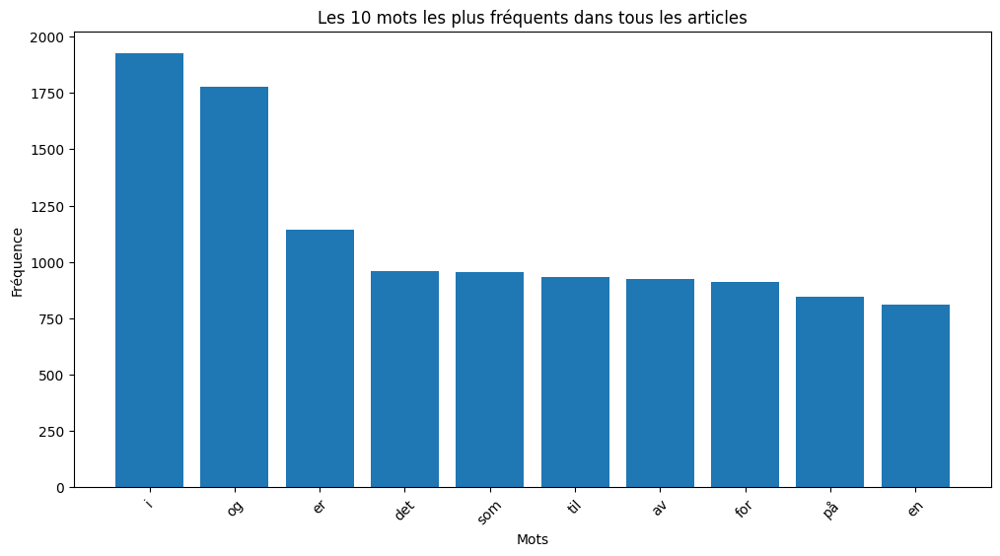

In [34]:
import matplotlib.pyplot as plt
from collections import Counter

# Initialiser un dictionnaire pour stocker les fréquences cumulées des mots
word_freq_cumulative = Counter()

# Parcourir tous les articles et mettre à jour les fréquences cumulées
for index, word_freq in word_freq_per_article.items():
    word_freq_cumulative.update(word_freq)

# Afficher les mots les plus fréquents dans un diagramme à barres
most_common_words = word_freq_cumulative.most_common(10)  # Vous pouvez ajuster le nombre de mots à afficher

# Extraire les mots et les fréquences pour le diagramme
words, frequencies = zip(*most_common_words)

# Créer le diagramme à barres
plt.figure(figsize=(12, 6))
plt.bar(words, frequencies)
plt.xlabel('Mots')
plt.ylabel('Fréquence')
plt.title('Les 10 mots les plus fréquents dans tous les articles')
plt.xticks(rotation=45)
plt.show()


Traduction des mots en français:

**'sier'** : 'dit' /
**'to'** : 'deux' /
**'år'** : 'années' /
**'Norge'** : 'Norvège' /
**'må'** : 'doit' /
**'Norwegian'** : 'norvégien' /
**'andre'** : 'autres' /
**'mer'** : 'plus' /
**'flere'** : 'plusieurs' /
**'Stortinget'** : 'le Parlement norvégien'/


**B-Dans chaque article :**

---



**-statistiquement:**

---




In [35]:
from collections import Counter

# Initialiser un dictionnaire pour stocker les fréquences des mots par article
word_freq_per_article = {}

# Parcourir tous les articles et compter la fréquence des mots
for index, tokens in enumerate(data['Tokens']):
    word_freq = Counter(tokens)
    word_freq_per_article[index] = word_freq

# Afficher les mots les plus fréquents pour chaque article
for index, word_freq in word_freq_per_article.items():
    most_common_words = word_freq.most_common(10)  # Vous pouvez ajuster le nombre de mots à afficher
    print(f"Mots les plus fréquents pour l'article {index}:")
    for word, freq in most_common_words:
        print(f"{word}: {freq}")


Mots les plus fréquents pour l'article 0:
i: 42
og: 37
det: 27
på: 27
som: 22
er: 22
har: 21
årets: 20
å: 19
til: 18
Mots les plus fréquents pour l'article 1:
norwegian: 24
to: 20
you: 15
the: 11
in: 10
are: 9
i: 8
en: 8
continue: 7
reading: 7
Mots les plus fréquents pour l'article 2:
i: 28
er: 24
det: 14
politiet: 13
oslo: 12
for: 11
og: 11
sier: 10
at: 10
til: 10
Mots les plus fréquents pour l'article 3:
i: 63
det: 50
og: 47
på: 44
å: 35
de: 35
til: 35
han: 32
var: 29
for: 27
Mots les plus fréquents pour l'article 4:
det: 28
en: 26
og: 24
har: 23
i: 22
for: 21
til: 20
politiet: 17
av: 17
er: 17
Mots les plus fréquents pour l'article 5:
i: 32
å: 19
og: 17
med: 16
for: 16
på: 15
til: 15
at: 14
er: 14
israel: 14
Mots les plus fréquents pour l'article 6:
norwegian: 2
learn: 1
naturally: 1
lessons: 1
by: 1
peder: 1
b: 1
helland: 1
Mots les plus fréquents pour l'article 7:
i: 33
det: 25
for: 25
at: 21
å: 20
er: 19
og: 16
av: 16
til: 14
med: 14
Mots les plus fréquents pour l'article 8:
min:

**-cartographie des mots:**

---



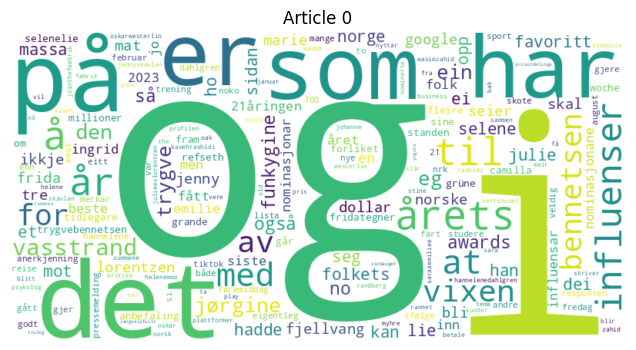

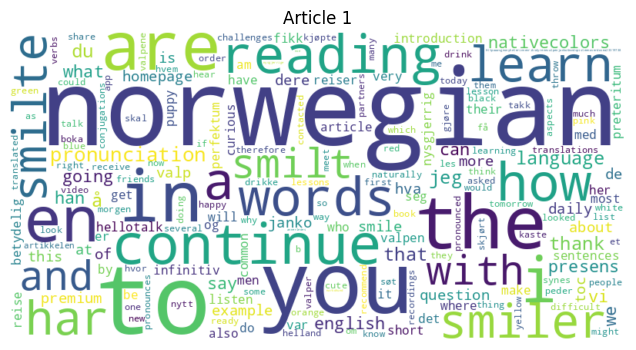

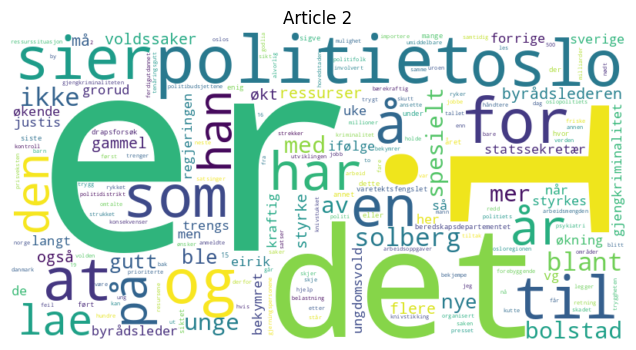

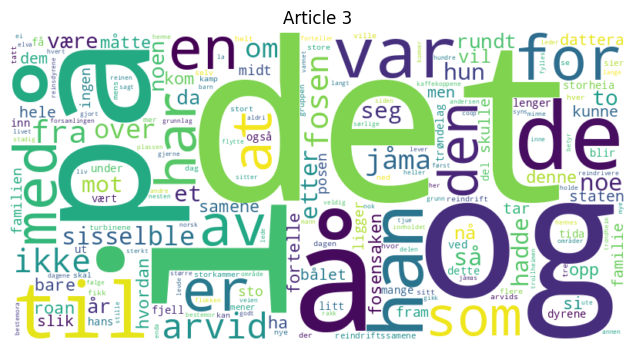

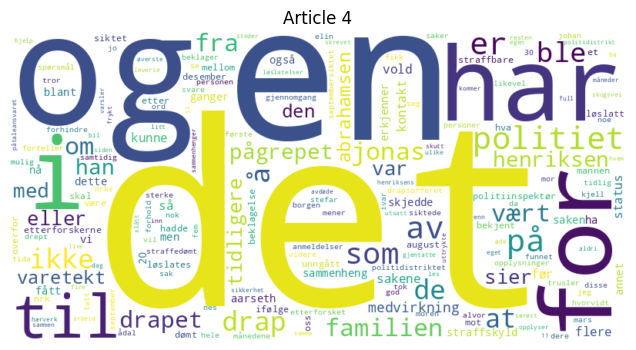

...

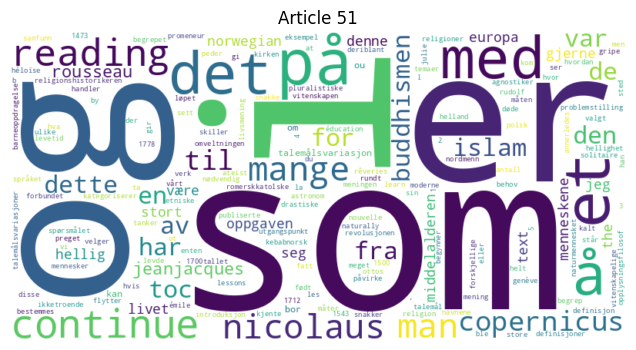

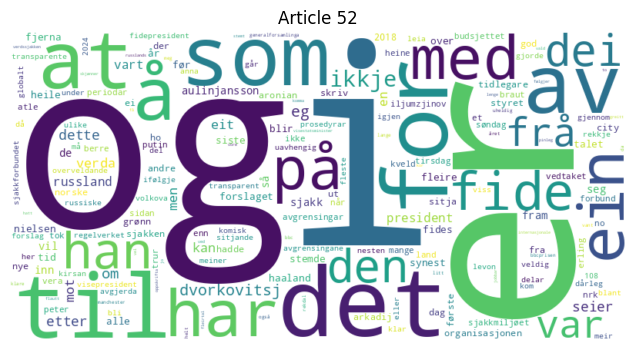

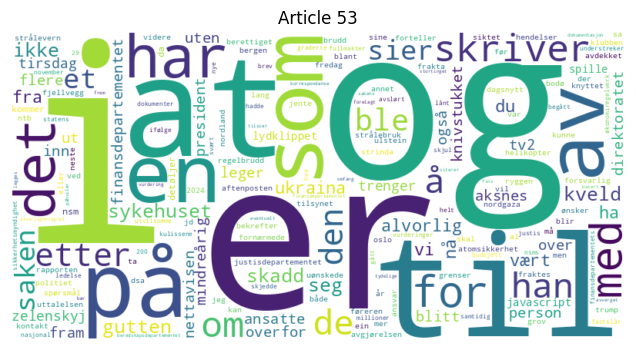

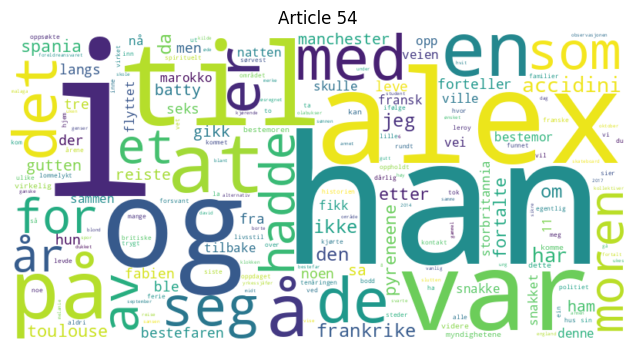

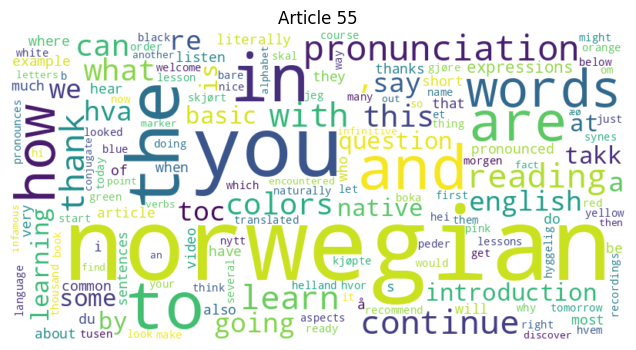

In [36]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Parcourir tous les articles et créer un nuage de mots pour chaque article
for index, word_freq in word_freq_per_article.items():
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq)

    # Afficher le nuage de mots pour chaque article
    plt.figure(figsize=(8, 4))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f"Article {index}")
    plt.axis('off')
    plt.show()


# **<font color="red">Topic modeling:**

---



**1-BERT** est basé sur l'architecture Transformer, qui utilise ce que l'on appelle l'attention pour permettre à l'IA de considérer le contexte des mots dans une phrase, plutôt que de traiter chaque mot séparément. Cela permet à BERT de saisir les nuances et la signification contextuelle des mots dans le texte.

**2- L'utilisation de BERT**pour le topic modeling avec des textes en norvégien nécessite l'utilisation d'un modèle pré-entraîné spécifique à la langue norvégienne.



Étape A: -Application du modèle de bert norvégien

Étape B: -Affichage des clusters et des articles

---




**Étape A: -Application du modèle de bert norvégien**

---



**1-Installation des dépendances :**

---



In [37]:
from transformers import AutoTokenizer, AutoModel
import torch
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import numpy as np

**2-Chargement un modèle BERT pré-entraîné multilingue :**

---



In [38]:
# Charger un modèle BERT pré-entraîné multilingue
tokenizer = AutoTokenizer.from_pretrained('bert-base-multilingual-uncased')
model = AutoModel.from_pretrained('bert-base-multilingual-uncased')

**3-Extraction des vecteurs de caractéristiques :**

---



Cette fonction prend en entrée des documents, les tokenise, puis passe les tokens à travers le modèle BERT pour obtenir des vecteurs de caractéristiques (embeddings)

In [39]:
# Fonction pour convertir les documents en vecteurs BERT
def get_bert_vectors(documents):
    model.eval()  # Mettre le modèle en mode évaluation
    vectors = []
    with torch.no_grad():  # Désactiver le calcul du gradient pour l'inférence
        for doc in documents:
            inputs = tokenizer(doc, return_tensors='pt', padding=True, truncation=True, max_length=512)
            outputs = model(**inputs)
            # Utiliser le vecteur du token [CLS] comme représentation du document
            vectors.append(outputs.pooler_output.squeeze().numpy())
    return np.array(vectors)

# Extrait les vecteurs pour vos documents
documents = data['Content_clean']  # Remplacer par vos documents nettoyés en norvégien
bert_vectors = get_bert_vectors(documents)

**4-Reduction de dimensionnalité avec PCA (Principal Component Analysis) :**

---



On applique PCA pour réduire la dimensionnalité des vecteurs BERT, car ceux-ci sont généralement de grande dimension (768 pour BERT-base) et on veut simplifier les données pour le clustering

In [40]:
# Réduction de dimensionnalité avec PCA
pca = PCA(n_components=50)  # Réduire à 50 composantes pour le clustering
reduced_vectors = pca.fit_transform(bert_vectors)

On utilise K-means pour regrouper les vecteurs réduits en un nombre défini de clusters.

In [41]:
# Clustering avec K-means
num_clusters = 15  #le nombre de clusters souhaité
kmeans = KMeans(n_clusters=num_clusters)
clusters = kmeans.fit_predict(reduced_vectors)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


**Étape B: -Affichage des clusters et des articles :**

---



In [42]:
from collections import Counter

Cette fonction a pour but de déterminer les termes les plus fréquents pour chaque cluster de documents.

In [43]:

# Fonction pour extraire les mots-clés de chaque cluster
def get_top_keywords(n_terms, cluster_centers, reduced_vectors, documents):
    keywords = {}
    for i in range(cluster_centers.shape[0]):
        # Trouver les documents les plus proches du centre de chaque cluster
        indices = np.argsort(np.linalg.norm(reduced_vectors - cluster_centers[i, :], axis=1))
        # Combiner tous les documents d'un cluster pour trouver les mots-clés les plus fréquents
        combined_text = " ".join([documents[index] for index in indices[:10]])
        counter = Counter(combined_text.split())
        most_common_terms = counter.most_common(n_terms)
        keywords[i] = most_common_terms
    return keywords

Affichage des clusters:

In [44]:
# Numéro des clusters
cluster_centers = kmeans.cluster_centers_

# Obtenir les mots-clés pour chaque cluster
top_keywords = get_top_keywords(n_terms=20, cluster_centers=cluster_centers, reduced_vectors=reduced_vectors, documents=documents)

# Afficher les sujets et leurs mots-clés
for cluster_num in top_keywords:
    print(f"Cluster {cluster_num}:")
    terms = [term for term, freq in top_keywords[cluster_num]]
    print(f"Top terms: {terms}\n")


Cluster 0:
Top terms: ['i', 'og', 'er', 'det', 'til', 'for', 'å', 'som', 'at', 'av', 'på', 'har', 'med', 'en', 'han', 'den', 'om', 'ein', 'de', 'et']

Cluster 1:
Top terms: ['og', 'i', 'som', 'av', 'til', 'er', 'på', 'for', 'en', 'har', 'med', 'det', 'å', 'de', 'et', 'fra', 'at', 'den', 'kan', 'var']

Cluster 2:
Top terms: ['i', 'og', 'er', 'det', 'som', 'av', 'at', 'en', 'til', 'å', 'norwegian', 'for', 'med', 'har', 'de', 'på', 'to', 'han', 'et', 'ikke']

Cluster 3:
Top terms: ['og', 'i', 'er', 'av', 'som', 'for', 'en', 'til', 'det', 'på', 'har', 'å', 'vi', 'med', 'de', 'at', 'kan', 'om', 'den', 'et']

Cluster 4:
Top terms: ['og', 'i', 'er', 'en', 'på', 'det', 'som', 'å', 'til', 'av', 'for', 'med', 'at', 'har', 'de', 'vi', 'den', 'et', 'om', 'kan']

Cluster 5:
Top terms: ['i', 'og', 'er', 'det', 'av', 'at', 'som', 'en', 'til', 'med', 'norwegian', 'å', 'for', 'de', 'på', 'har', 'to', 'han', 'you', 'den']

Cluster 6:
Top terms: ['i', 'og', 'er', 'det', 'til', 'som', 'av', 'at', 'for', '

on peut dire que, par exemple:


*   **Cluster 3 :** Avec des mots comme "regjeringen" (le gouvernement) et "norsk" (norvégien), ce cluster semble porter sur la politique ou les activités gouvernementales en Norvège

*   **Cluster 2 :** Sujets concernant l'innovation en Norvège, l'intelligence artificielle, et peut-être des rapports ou études sur des sujets de technologie et de science.



**Affichage des articles de chaque cluster:**

In [45]:
from collections import defaultdict

# Créer une structure pour maintenir les identifiants de documents par cluster
cluster_documents = defaultdict(list)

# Assigner chaque identifiant de document à son cluster correspondant
# Ici, `doc_id` est l'indice du document dans votre liste de documents
for doc_id, cluster_label in enumerate(clusters):
    cluster_documents[cluster_label].append(doc_id)  # Utilisez `doc_id` si c'est l'identifiant unique

# Afficher les clusters et les identifiants des documents sans montrer leur contenu
for cluster_label, doc_ids in cluster_documents.items():
    print(f"Cluster {cluster_label}: Total Articles = {len(doc_ids)}")
    for doc_id in doc_ids:
        print(f" - Article: {doc_id}")
    print()  # Ligne vide pour séparer les clusters


Cluster 14: Total Articles = 9
 - Article: 0
 - Article: 3
 - Article: 27
 - Article: 32
 - Article: 41
 - Article: 45
 - Article: 46
 - Article: 50
 - Article: 53

Cluster 12: Total Articles = 1
 - Article: 1

Cluster 0: Total Articles = 11
 - Article: 2
 - Article: 5
 - Article: 7
 - Article: 9
 - Article: 12
 - Article: 14
 - Article: 25
 - Article: 33
 - Article: 40
 - Article: 52
 - Article: 54

Cluster 10: Total Articles = 8
 - Article: 4
 - Article: 13
 - Article: 15
 - Article: 18
 - Article: 20
 - Article: 24
 - Article: 26
 - Article: 35

Cluster 5: Total Articles = 1
 - Article: 6

Cluster 11: Total Articles = 1
 - Article: 8

Cluster 4: Total Articles = 2
 - Article: 10
 - Article: 11

Cluster 8: Total Articles = 8
 - Article: 16
 - Article: 19
 - Article: 21
 - Article: 30
 - Article: 34
 - Article: 39
 - Article: 43
 - Article: 51

Cluster 3: Total Articles = 6
 - Article: 17
 - Article: 28
 - Article: 29
 - Article: 36
 - Article: 37
 - Article: 44

Cluster 7: Total Arti

italicized text# **<font color="red">Embeddings de Mots:**

L'embedding consiste à représenter les mots et les phrases sous forme de vecteurs de nombres réels dans un espace multidimensionnel, ce qui permet aux algorithmes de traiter et d'analyser le texte de manière plus efficace.

Puisque on traite une nouvelle langue : la norvégienne ,
on 'est censé utiliser un modèle d'emeddings qui support notre langue.
Alors on va télécharger  **le modèle FastText pour le norvégien**

In [46]:
!pip install fasttext
import fasttext.util

In [47]:
# Fonction pour obtenir l'embedding d'un mot
def get_embedding(word):
    return ft.get_word_vector(word)

# <font color="red">**T5 Modeling**

In [48]:
!pip install sentencepiece


In [49]:
!pip install --upgrade urllib3


In [50]:
!apt-get install -y build-essential


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
build-essential is already the newest version (12.9ubuntu3).
0 upgraded, 0 newly installed, 0 to remove and 24 not upgraded.


In [52]:
!pip install torch
!pip install transformers
!pip install sentencepiece


In [53]:
import pandas as pd
from sklearn.model_selection import train_test_split
from transformers import T5Tokenizer, T5ForConditionalGeneration
from transformers import T5Tokenizer, T5ForConditionalGeneration



# Load the Norwegian T5 model and tokenizer
tokenizer = T5Tokenizer.from_pretrained('t5-base')
model = T5ForConditionalGeneration.from_pretrained('t5-base')

# Load your dataset

# Split the data into training (80%) and test (20%) sets
train_data, test_data = train_test_split(data4, test_size=0.2, random_state=42)

# Function to generate summaries
def generate_summary(text):
    inputs = tokenizer.encode("summarize: " + text, return_tensors='pt', max_length=512, truncation=True)
    output = model.generate(inputs, min_length=80, max_length=100)
    summary = tokenizer.decode(output[0], skip_special_tokens=True)
    return summary

# Apply the function to the 'Content_clean' column of the training set
train_data['Summary'] = train_data['Content_clean'].apply(generate_summary)

# Display the summarized training data
print("Training Data:")
print(train_data[['Content_clean', 'Summary']])

# Apply the function to the 'Content_clean' column of the test set
test_data['Summary'] = test_data['Content_clean'].apply(generate_summary)

# Display the summarized test data
print("\nTest Data:")
print(test_data[['Content_clean', 'Summary']])


/usr/local/lib/python3.10/dist-packages/transformers/models/t5/tokenization_t5.py:240: FutureWarning: This tokenizer was incorrectly instantiated with a model max length of 512 which will be corrected in Transformers v5.
For now, this behavior is kept to avoid breaking backwards compatibility when padding/encoding with `truncation is True`.
- Be aware that you SHOULD NOT rely on t5-base automatically truncating your input to 512 when padding/encoding.
- If you want to encode/pad to sequences longer than 512 you can either instantiate this tokenizer with `model_max_length` or pass `max_length` when encoding/padding.
- To avoid this warning, please instantiate this tokenizer with `model_max_length` set to your preferred value.
  warnings.warn(
You are using the default legacy behaviour of the <class 'transformers.models.t5.tokenization_t5.T5Tokenizer'>. This is expected, and simply means that the `legacy` (previous) behavior will be used so nothing changes for you. If you want to use the

Training Data:
                                        Content_clean  \
34  17112023 140335 cet innovasjon norge ecosubsea...   
30  nei innovasjon i helsevesenet er ikke dømt til...   
8   forside utforsk direkte følg del hard langkjør...   
17  debatt regjeringens forslag til statsbudsjett ...   
6   learn norwegian naturally norwegian lessons by...   
4   familien tror jonas henriksen kunne vært i liv...   
41  dette er budskapet til tor w andreassen som fo...   
27  multisky er nøkkelordet for de som ønsker hand...   
47  abortutvalget foreslår å utvide selvbestemt ab...   
46  en ny rapport om digitalisering i kommunene vi...   
52  flautt pinleg og komisk kritikken haglar mot d...   
15  like etter krigen fastslo de politiske partien...   
9   flautt pinleg og komisk kritikken haglar mot d...   
16  2762023 070000 cest sintef globale kriser knyt...   
24  papiravisen eavis eaviser fra hele landet lese...   
31  vi ser etter en leannavigatør til teamet vårt ...   
53  i dokumenter

# **<font color="red">Evaluation du model T5**

In [54]:
!pip install nltk rouge-score


In [58]:
!pip install rouge-score


In [56]:
from rouge_score import rouge_scorer


In [60]:
!pip install rouge


In [62]:
import sys
sys.setrecursionlimit(10**6)


In [63]:
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction
from rouge import Rouge

# Function to calculate BLEU score
def calculate_bleu(reference, candidate):
    reference = [reference.split()]
    candidate = candidate.split()
    smoothing_function = SmoothingFunction().method1
    return sentence_bleu(reference, candidate, smoothing_function=smoothing_function)

# Function to calculate ROUGE scores
def calculate_rouge(reference, candidate):
    rouge = Rouge()
    scores = rouge.get_scores(candidate, reference)
    return scores[0]['rouge-1']['f'], scores[0]['rouge-2']['f'], scores[0]['rouge-l']['f']

# Apply the evaluation functions to the test set
test_data['BLEU'] = test_data.apply(lambda row: calculate_bleu(row['Content_clean'], row['Summary']), axis=1)
test_data['ROUGE-1'], test_data['ROUGE-2'], test_data['ROUGE-L'] = zip(*test_data.apply(lambda row: calculate_rouge(row['Content_clean'], row['Summary']), axis=1))

# Display the evaluation results
print("\nEvaluation Results:")
print(test_data[['Content_clean', 'Summary', 'BLEU', 'ROUGE-1', 'ROUGE-2', 'ROUGE-L']])



Evaluation Results:
                                        Content_clean  \
0   han glana lengselsfullt inn vindauget til pris...   
5   fns tryggingsråd røystar tysdag kveld om å sto...   
33  kjerstin aukrust er førsteamanuensis i fransk ...   
13  det norskeide skipet strinda er truffet av en ...   
19  regjeringens to ansikter regjeringsmakten både...   
50  hørt om loven mot lønnstyveri da silvia anmeld...   
36  politikk er i vid forstand all aktivitet som b...   
26  digitalisering av helse og omsorgstjenestene e...   
44  regjeringen er navnet på norges utøvende myndi...   
12  det amerikanske senatet tar sikte på å få vedt...   
54  britiske alex batty reiste på ferie til spania...   
3   arvid jåma har stått i fosensaken i over tjue ...   

                                              Summary          BLEU   ROUGE-1  \
0   han hundretusenvis p vixen awards i r vixen aw...  5.299320e-19  0.062331   
5   fns tryggingsrd rystar tysdag kveld om  stoppe...  2.812668e-19  0.0721

In [64]:
# Apply the function to the 'Content_clean' column of the test set
test_data['Generated_Summary'] = test_data['Content_clean'].apply(generate_summary)

# Display the original and generated summaries in the test data for manual evaluation
print("Manual Evaluation - Test Data:")
print(test_data[['Content_clean', 'Summary', 'Generated_Summary']])

Manual Evaluation - Test Data:
                                        Content_clean  \
0   han glana lengselsfullt inn vindauget til pris...   
5   fns tryggingsråd røystar tysdag kveld om å sto...   
33  kjerstin aukrust er førsteamanuensis i fransk ...   
13  det norskeide skipet strinda er truffet av en ...   
19  regjeringens to ansikter regjeringsmakten både...   
50  hørt om loven mot lønnstyveri da silvia anmeld...   
36  politikk er i vid forstand all aktivitet som b...   
26  digitalisering av helse og omsorgstjenestene e...   
44  regjeringen er navnet på norges utøvende myndi...   
12  det amerikanske senatet tar sikte på å få vedt...   
54  britiske alex batty reiste på ferie til spania...   
3   arvid jåma har stått i fosensaken i over tjue ...   

                                              Summary  \
0   han hundretusenvis p vixen awards i r vixen aw...   
5   fns tryggingsrd rystar tysdag kveld om  stoppe...   
33  kjerstin aukrust er frsteamanuensis i fransk l...   

In [65]:
# Function to calculate BLEU score
def calculate_bleu(reference, candidate):
    reference = [reference.split()]
    candidate = candidate.split()
    smoothing_function = SmoothingFunction().method1
    return sentence_bleu(reference, candidate, smoothing_function=smoothing_function)

# Function to calculate ROUGE scores
def calculate_rouge(reference, candidate):
    rouge = Rouge()
    scores = rouge.get_scores(candidate, reference)
    rouge_1 = scores[0]['rouge-1']['f']
    rouge_2 = scores[0]['rouge-2']['f']
    rouge_l = scores[0]['rouge-l']['f']
    return rouge_1, rouge_2, rouge_l

# Apply the evaluation functions to the test set
test_data['BLEU'] = test_data.apply(lambda row: calculate_bleu(row['Summary'], row['Generated_Summary']), axis=1)
test_data['ROUGE-1'], test_data['ROUGE-2'], test_data['ROUGE-L'] = zip(*test_data.apply(lambda row: calculate_rouge(row['Summary'], row['Generated_Summary']), axis=1))

# Display the evaluation results
print("Evaluation Results - Test Data:")
print(test_data[['Content_clean', 'Summary', 'Generated_Summary', 'BLEU', 'ROUGE-1', 'ROUGE-2', 'ROUGE-L']])

Evaluation Results - Test Data:
                                        Content_clean  \
0   han glana lengselsfullt inn vindauget til pris...   
5   fns tryggingsråd røystar tysdag kveld om å sto...   
33  kjerstin aukrust er førsteamanuensis i fransk ...   
13  det norskeide skipet strinda er truffet av en ...   
19  regjeringens to ansikter regjeringsmakten både...   
50  hørt om loven mot lønnstyveri da silvia anmeld...   
36  politikk er i vid forstand all aktivitet som b...   
26  digitalisering av helse og omsorgstjenestene e...   
44  regjeringen er navnet på norges utøvende myndi...   
12  det amerikanske senatet tar sikte på å få vedt...   
54  britiske alex batty reiste på ferie til spania...   
3   arvid jåma har stått i fosensaken i over tjue ...   

                                              Summary  \
0   han hundretusenvis p vixen awards i r vixen aw...   
5   fns tryggingsrd rystar tysdag kveld om  stoppe...   
33  kjerstin aukrust er frsteamanuensis i fransk l...  